In [4]:
# Core Libraries
import numpy as np  # For numerical operations
import pandas as pd  # For data manipulation
from google.colab import drive

# Deep Learning
import tensorflow as tf
from tensorflow.keras import layers, models  # For building the CNN

# Data Visualization
import matplotlib.pyplot as plt

# OS and Warnings
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress unnecessary TensorFlow warnings


TensorFlow Warning Suppression (TF_CPP_MIN_LOG_LEVEL)
Why? TensorFlow prints a lot of unnecessary logs.
Setting:
python
Copy
Edit
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress INFO and WARNING messages
0: Show all logs
1: Hide INFO logs
2: Hide INFO + WARNING logs
3: Hide INFO + WARNING + ERROR logs
Do You Need It?
If logs are too noisy, keep os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'.
Otherwise, remove it—it won’t affect model training.

In [5]:
# Define constants for image processing and model training
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 10

# Define input shape for CNN (excluding batch size)
input_shape = (IMAGE_SIZE, IMAGE_SIZE, CHANNELS)  # (Height, Width, Channels)


In [6]:

# Mount Google Drive
drive.mount('/content/drive')

# Set the correct dataset path inside Google Drive
dataset_path = "/content/drive/MyDrive/ds_plantleaves_potato"  # Update if needed



Mounted at /content/drive


In [7]:
# Load dataset from the directory
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    label_mode='categorical'  # This ensures the labels are one-hot encoded



)
#label_mode='categorical'  # This ensures the labels are one-hot encoded

Found 2152 files belonging to 3 classes.


In [23]:
# Check class names to verify correct loading
class_names = dataset.class_names
print("Classes:", class_names)  # Should print categories like 'Healthy', 'Late Blight', etc.


Classes: ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']


In [7]:
# Check total number of batches
print("Total batches:", len(dataset))


Total batches: 68


In [8]:

# Check total images in dataset
total_images = len(dataset) * BATCH_SIZE  # Approximate count
print("Estimated total images:", total_images)


Estimated total images: 2176


In [90]:
# Verify batch details
for image_batch, label_batch in dataset.take(1):  # Take one batch
    print("Image batch shape:", image_batch.shape)  # Should be (Batch_Size, 256, 256, 3)
    print("Label batch:", label_batch.numpy())  # Print labels

Image batch shape: (32, 256, 256, 3)
Label batch: [[1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [0. 1. 0.]
 [0. 0. 1.]
 [0. 1. 0.]
 [0. 1. 0.]
 [1. 0. 0.]]


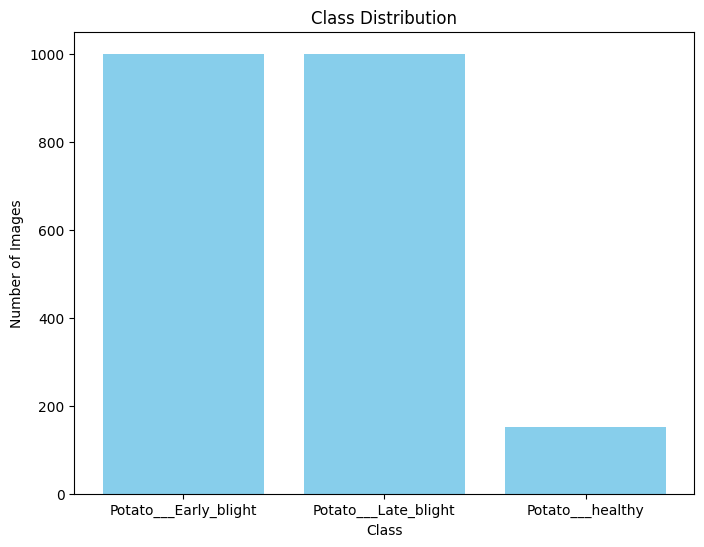

In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf

# Assuming you have the dataset loaded as 'dataset'
class_names = dataset.class_names  # Get the class names (labels)

# Count the number of samples per class
class_counts = [0] * len(class_names)  # Initialize an empty list to store class counts

# Iterate over the dataset and count the occurrences of each class
for images, labels in dataset:
    for label in labels.numpy():  # labels are one-hot encoded, so we sum them
        class_counts[label] += 1

# Create a bar plot for class distribution
plt.figure(figsize=(8, 6))
plt.bar(class_names, class_counts, color='skyblue')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Class Distribution')
plt.show()


In [ ]:
import numpy as np

# Assuming 'dataset' is the variable containing the image dataset
image_sizes = []

# Get the first 3 images from the dataset and inspect their dimensions
for images, labels in dataset.take(1):  # 'take(1)' gets one batch of data
    for i, image in enumerate(images):
        if i < 3:  # Stop after checking the first 3 images
            image_sizes.append(image.shape)

# Convert to a numpy array for easier analysis
image_sizes = np.array(image_sizes)

# Print the dimensions of the first 3 images
print("Dimensions of first 3 images in dataset:")
for i, size in enumerate(image_sizes):
    print(f"Image {i+1} shape: {size}")


Dimensions of first 3 images in dataset:
Image 1 shape: [256 256   3]
Image 2 shape: [256 256   3]
Image 3 shape: [256 256   3]


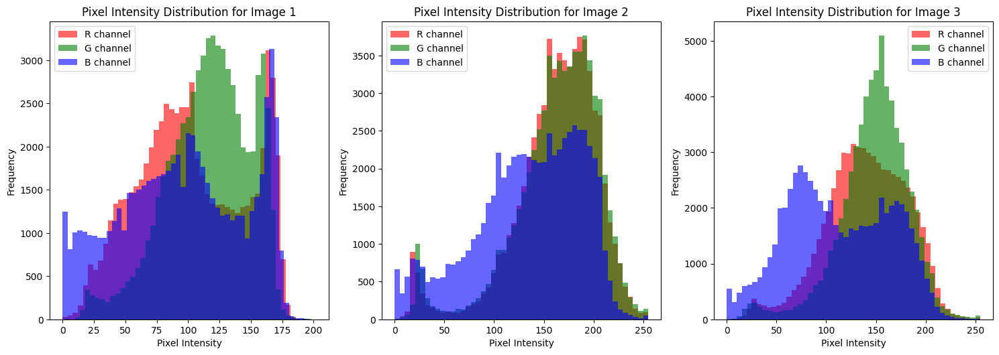

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sample 5 images from the dataset
sample_images = []
for images, labels in dataset.take(1):  # Take one batch from the dataset
    sample_images = images[:3]  # Take the first 3 images from the batch

# Create a figure to hold subplots for each image's pixel intensity distribution
plt.figure(figsize=(15, 10))

# Iterate over the sample images and plot histograms for each
for i, image in enumerate(sample_images):
    # Flatten the image to 1D array for each channel
    plt.subplot(2, 3, i + 1)
    plt.title(f"Pixel Intensity Distribution for Image {i + 1}")

    # Plot histogram for each of the three channels
    for channel, color in zip(range(3), ['r', 'g', 'b']):
        plt.hist(image[..., channel].numpy().flatten(), bins=50, color=color, alpha=0.6, label=f'{color.upper()} channel')

    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend()

# Display the plots
plt.tight_layout()
plt.show()


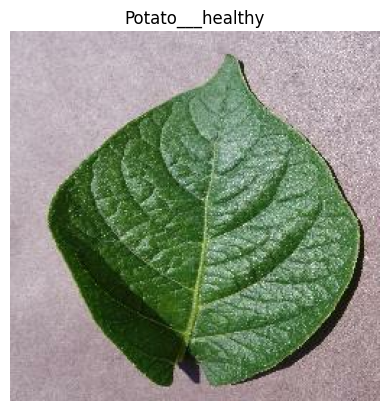

In [ ]:
import matplotlib.pyplot as plt

# Viewing a Single Image
for image_batch, label_batch in dataset.take(1):  # Using the 'dataset' variable
    plt.imshow(image_batch[0].numpy().astype("uint8"))  # Display the first image in the batch
    plt.title(class_names[label_batch[0]])  # Title with the corresponding class name
    plt.axis("off")  # Turn off axis points
    plt.show()  # Show the image

# refreshing every time gives another picture and label as given

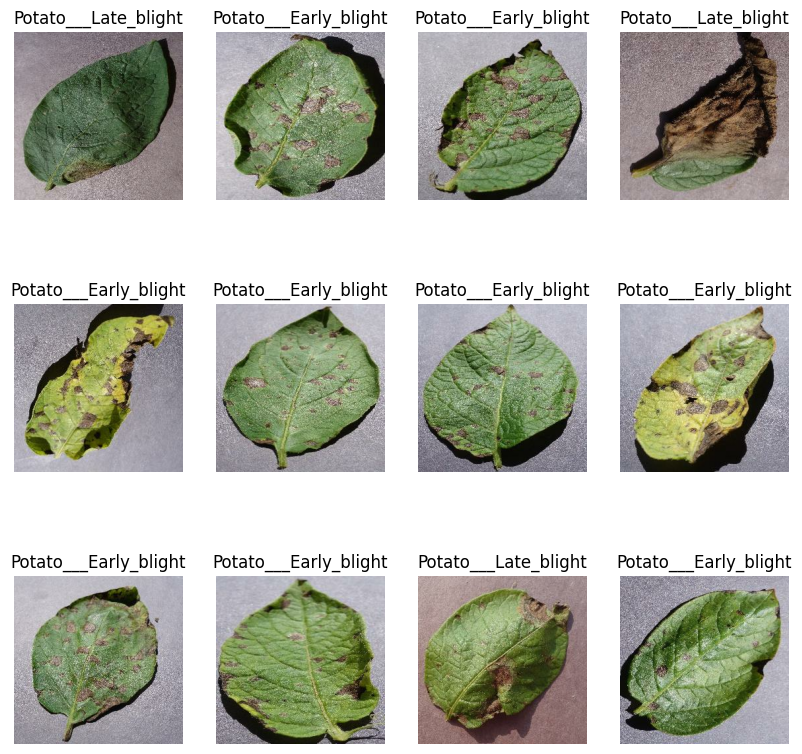

In [ ]:

# Step 2: Refreshing and Viewing  Batch of Images
plt.figure(figsize=(10, 10))
for image_batch, label_batch in dataset.take(1):  # Use 'dataset' instead of 'df'
    for i in range(12):  # Display 12 images
        plt.subplot(3, 4, i + 1)  # Create a 3x4 grid for images
        plt.imshow(image_batch[i].numpy().astype("uint8"))  # Convert to uint8 for proper display
        plt.title(class_names[label_batch[i]])  # Title with class name
        plt.axis('off')  # Turn off axes

plt.show()  # Show the figure

Step 3 : Splitting Dataset
80% --> Training
20% --> 10% Validation and 10% Testing

In [ ]:
# channels (RGB[Red, Green, Blue]), Epochs = 10
CHANNELS = 3
EPOCHS = 10

In [ ]:
train_size = 0.8
validation_size = 0.1
test_size = 0.1

In [ ]:
# checking the length of training data


len(dataset)*train_size


54.400000000000006

In [ ]:
#len(train_ds)
#train_ds = dataset.take(54)

In [ ]:

# length of validation and test data
val_n_test = len(dataset) - (len(dataset) * train_size)
val_n_test

13.599999999999994

In [ ]:
 test_ds = dataset.skip(54)
# #temporarily storing rest of the images as test in test_ds
len(test_ds)

14

In [ ]:
validation_size * len(dataset)


6.800000000000001

In [ ]:
val_ds = test_ds.take(6)
len(val_ds)


6

In [ ]:
test_ds = test_ds.skip(6)
len(test_ds)


8

In [8]:
def split_dataset(dataset, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_buffer_size=10000):
    """
    Splits a TensorFlow dataset into training, validation, and test sets.

    Parameters:
    - dataset (tf.data.Dataset): The input TensorFlow dataset to be split.
    - train_split (float): Proportion of the dataset to be used for training.
    - val_split (float): Proportion of the dataset to be used for validation.
    - test_split (float): Proportion of the dataset to be used for testing.
    - shuffle (bool): Whether to shuffle the dataset before splitting.
    - shuffle_buffer_size (int): Size of the buffer to use for shuffling.

    Returns:
    - train_dataset (tf.data.Dataset): The training dataset.
    - val_dataset (tf.data.Dataset): The validation dataset.
    - test_dataset (tf.data.Dataset): The test dataset.
    """

    # Determine the total number of samples in the dataset
    total_size = len(dataset)

    # Shuffle the dataset if requested
    if shuffle:
        dataset = dataset.shuffle(shuffle_buffer_size, seed=12)

    # Calculate the sizes of each dataset split
    train_size = int(train_split * total_size)
    val_size = int(val_split * total_size)
    test_size = total_size - train_size - val_size  # Remaining samples

    # Split the dataset dataset into training, validation, and test sets
    train_dataset = dataset.take(train_size)                       #  taking first 54 batches(out of 68) for training
    val_dataset = dataset.skip(train_size).take(val_size)     # Skipping training --first 54 and taking next 6 batches for validation samples
    test_dataset = dataset.skip(train_size + val_size)         # skipping first 54(train) batch and 6(validation) batch and taking left 8 batches  for testing



    return train_dataset, val_dataset, test_dataset



In [9]:
# Using the function to split the dataset
train_ds, val_ds, test_ds = split_dataset(dataset)



In [10]:

# Print the sizes of each dataset split
print("Total number of samples in the dataset:", len(dataset))
print("Number of Training Batches:", len(train_ds))  # Total training batches
print("Number of Validation Batches:", len(val_ds))  # Total validation batches
print("Number of Testing Batches:", len(test_ds))     # Total testing batches

Total number of samples in the dataset: 68
Number of Training Batches: 54
Number of Validation Batches: 6
Number of Testing Batches: 8


In [11]:

# Optimize the datasets with caching and prefetching
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

Building the Model
Creating a Layer for Resizing and Normalization

Before we feed our images to network, we should be resizing it to the desired size. Moreover, to improve model performance, we should normalize the image pixel value (keeping them in range 0 and 1 by dividing by 256). This should happen while training as well as inference. Hence we can add that as a layer in our Sequential Model.

Image Resizing and Normalization

In [12]:


# Step 1: Image Resizing and Normalization
resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),  # Resize to target size
    layers.Rescaling(1.0 / 255)                # Normalize pixel values to [0, 1]
])


Data Augmentation
Data Augmentation is needed when we have less data, this boosts the accuracy of our model by augmenting the data.

In [13]:
# Step 2: Data Augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),  # Randomly flip images horizontally and vertically
    layers.RandomRotation(0.2),                    # Randomly rotate images by 20%
])

Applying Data Augmentation to Train Dataset

In [14]:


# Step 3: Applying Data Augmentation to Training Dataset
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)



In [31]:

# Define input shape
input_shape = (IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3

# Building the Model with More Layers
cnn_model = models.Sequential([
    layers.Input(shape=input_shape),               # Input layer with specified shape
    resize_and_rescale,
    data_augmentation,

    # Convolutional Block 1
    layers.Conv2D(32, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    # Convolutional Block 2
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    # Convolutional Block 3
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

     # Convolutional Block 4
    layers.Conv2D(64, (3, 3), activation='relu'),  # Increased filters for deep features
    layers.MaxPooling2D((2, 2)),

    # Convolutional Block 5
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),

    # Convolutional Block 6
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),


    # Flatten and Fully Connected Dense Layers
    layers.Flatten(),
    layers.Dense(64, activation='relu'),   # Hidden dense layer
    layers.Dense(n_classes, activation='softmax')  # Output layer
])


# Build the model
cnn_model.build(input_shape=(None, IMAGE_SIZE, IMAGE_SIZE, CHANNELS))


In [32]:

# Model summary
cnn_model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential_3 (Sequential)       │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_4 (Sequential)       │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 60, 60, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 12, 12, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 4, 4, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 183,747 (717.76 KB)

 Trainable params: 183,747 (717.76 KB)

 Non-trainable params: 0 (0.00 B)

In [33]:
cnn_model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)


In [34]:


history_cnn = cnn_model.fit(train_ds,
                    epochs=EPOCHS,
                    batch_size=BATCH_SIZE,
                    verbose=1,
                    validation_data=val_ds,
                    )


Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 35s 495ms/step - accuracy: 0.4294 - loss: 0.9753 - val_accuracy: 0.6146 - val_loss: 0.7909
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 18s 337ms/step - accuracy: 0.6548 - loss: 0.7912 - val_accuracy: 0.6719 - val_loss: 0.8874
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 20s 365ms/step - accuracy: 0.7813 - loss: 0.5407 - val_accuracy: 0.7917 - val_loss: 0.4018
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 18s 336ms/step - accuracy: 0.8393 - loss: 0.3832 - val_accuracy: 0.8490 - val_loss: 0.4565
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 18s 339ms/step - accuracy: 0.8422 - loss: 0.4037 - val_accuracy: 0.9167 - val_loss: 0.2307
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 19s 343ms/step - accuracy: 0.8815 - loss: 0.2727 - val_accuracy: 0.8854 - val_loss: 0.2697
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 18s 336ms/step - accuracy: 0.8661 - loss: 0.2919 - val_accuracy: 0.9583 - val_loss: 0.1565
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 19s 351ms/step - accuracy: 0.8984 - loss: 0.2499 - val_accu

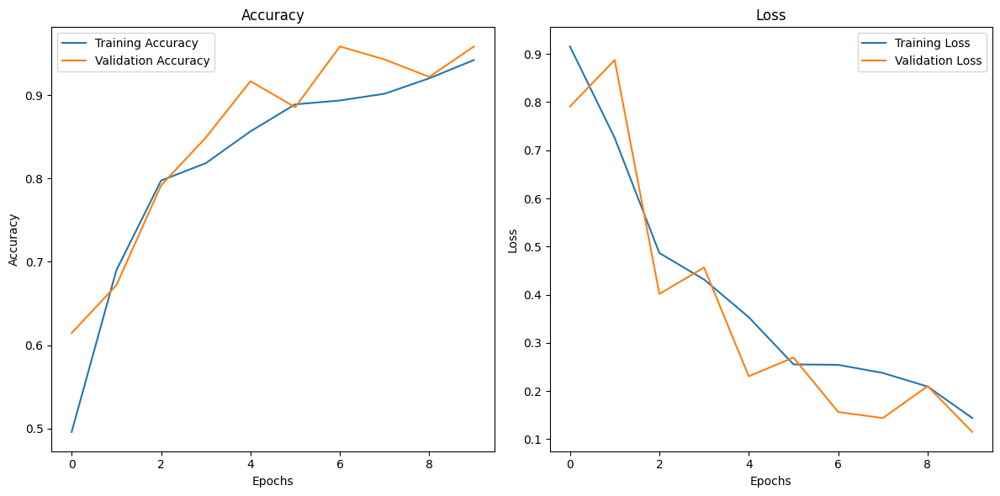

In [39]:
import matplotlib.pyplot as plt
# Plot accuracy
plt.figure(figsize=(12, 6))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history_cnn.history['accuracy'], label='Training Accuracy')
plt.plot(history_cnn.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history_cnn.history['loss'], label='Training Loss')
plt.plot(history_cnn.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Show the plots
plt.tight_layout()
plt.show()

first image to predict
actual label: Potato___Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
predicted label: Potato___Late_blight


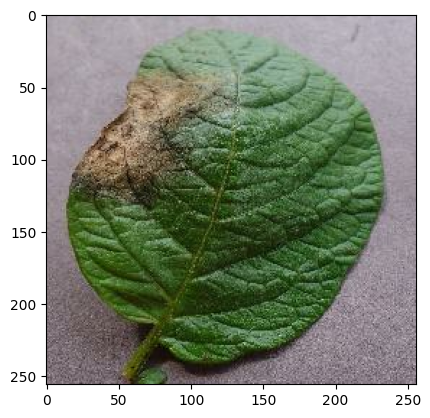

In [40]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):

  first_image = images_batch[0].numpy().astype('uint8')
  first_label = labels_batch[0].numpy()

  print("first image to predict")
  plt.imshow(first_image)
  print("actual label:", class_names[first_label])

  batch_prediction = cnn_model.predict(images_batch)
  print("predicted label:", class_names[np.argmax(batch_prediction[0])])

In [41]:
def predict(cnn_model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = cnn_model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


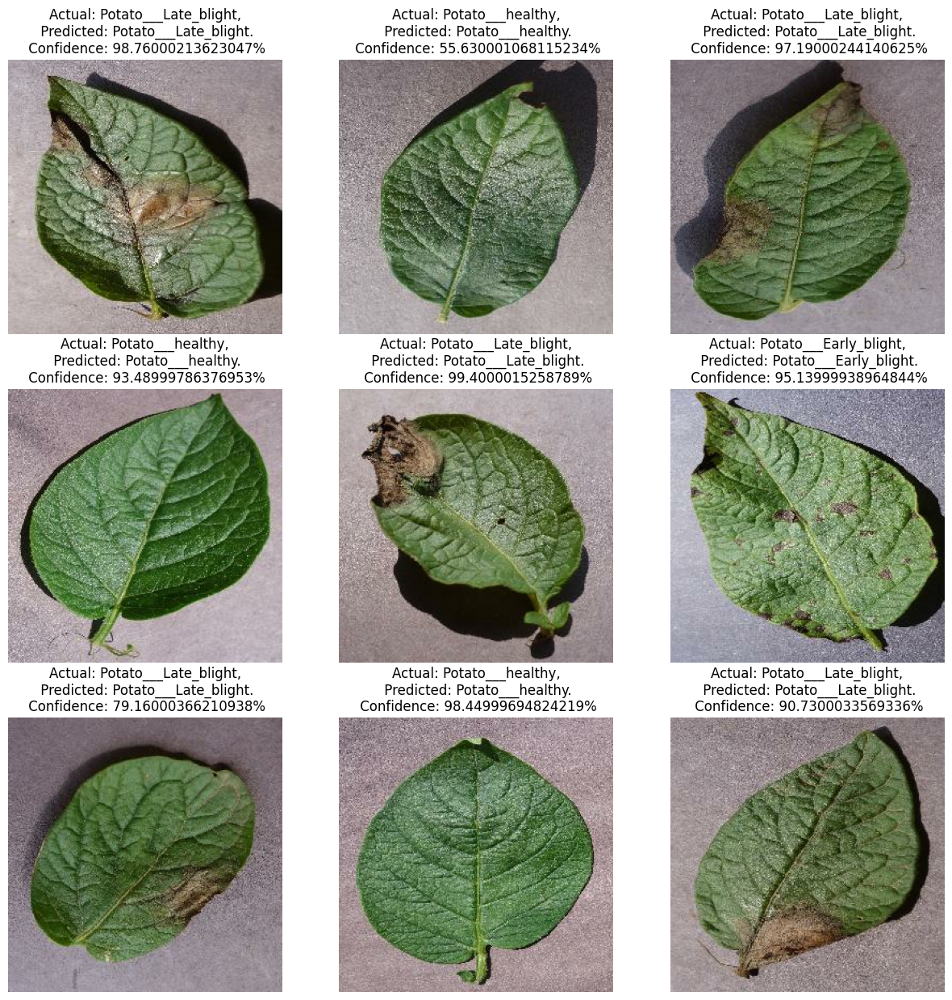

In [42]:

plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(cnn_model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

In [43]:


# Create a directory in Google Drive to save the model (optional)
cnn_model_save_path = '/content/drive/MyDrive/ds_plantleaves_potato'  # Adjust the path as needed
os.makedirs(cnn_model_save_path, exist_ok=True)

# Save the model
cnn_model_version = 1
cnn_model.save(os.path.join(cnn_model_save_path, f'cnn_model_{cnn_model_version}.keras'))

In [44]:
from tensorflow.keras.models import load_model

# Load the saved model
saved_model_path = '/content/drive/MyDrive/ds_plantleaves_potato/cnn_model_1.keras'
loaded_model = load_model(saved_model_path)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


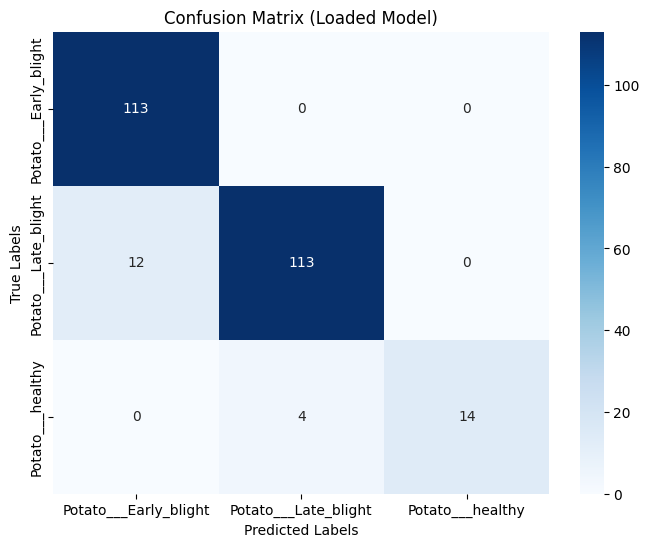

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
from tensorflow.keras.models import load_model

# Load the saved model
saved_model_path = '/content/drive/MyDrive/ds_plantleaves_potato/cnn_model_1.keras'
loaded_model = load_model(saved_model_path)

# Initialize lists to store the true labels and predicted labels
y_true1 = []
y_pred1 = []

# Loop through the test dataset and get predictions
for images_batch, labels_batch in test_ds:
    # Predict labels using the loaded model
    batch_predictions = loaded_model.predict(images_batch)
    predicted_labels = np.argmax(batch_predictions, axis=1)  # Get the predicted class labels (indices)

    # Since labels are integer encoded, use them as is
    true_labels = labels_batch.numpy()  # Use as is for integer encoded labels

    # Append the true and predicted labels to the lists
    y_true1.extend(true_labels)
    y_pred1.extend(predicted_labels)

# Compute confusion matrix
cm = confusion_matrix(y_true1, y_pred1)

# Plot confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix (Loaded Model)")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()



In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Calculate precision, recall, f1-score, and accuracy
precision = precision_score(y_true1, y_pred1, average='weighted')  # Change 'weighted' to 'micro' or 'macro' if needed
recall = recall_score(y_true1, y_pred1, average='weighted')
f1 = f1_score(y_true1, y_pred1, average='weighted')
accuracy = accuracy_score(y_true1, y_pred1)

# Print the metrics
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Accuracy: {accuracy}")

In [53]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers, models

# Load VGG16 model without the top layer (pre-trained on ImageNet)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))

# Freeze the layers of the VGG16 model
base_model.trainable = False

# Build the model by adding custom layers
VGG16_model = models.Sequential([
    base_model,
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(3, activation='softmax')  # 3 output classes
])

# Compile the model
VGG16_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


# Print model summary
VGG16_model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 8, 8, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │     8,388,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 3)              │           771 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,104,323 (88.14 MB)

 Trainable params: 8,389,635 (32.00 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [54]:
EPOCHS = 10  # Adjust as needed

history_vgg = VGG16_model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS)


Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 50s 482ms/step - accuracy: 0.7201 - loss: 17.8878 - val_accuracy: 0.9583 - val_loss: 0.5132
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 47s 246ms/step - accuracy: 0.9566 - loss: 1.0209 - val_accuracy: 0.9896 - val_loss: 0.0111
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 21s 256ms/step - accuracy: 0.9640 - loss: 0.3539 - val_accuracy: 0.9844 - val_loss: 0.1132
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 15s 286ms/step - accuracy: 0.9732 - loss: 0.1796 - val_accuracy: 0.9896 - val_loss: 0.0452
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 20s 270ms/step - accuracy: 0.9738 - loss: 0.1502 - val_accuracy: 1.0000 - val_loss: 0.0082
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - accuracy: 0.9758 - loss: 0.0759 - val_accuracy: 0.9740 - val_loss: 0.0860
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 13s 247ms/step - accuracy: 0.9795 - loss: 0.0617 - val_accuracy: 0.9844 - val_loss: 0.0501
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 21s 247ms/step - accuracy: 0.9823 - loss: 0.0648 - val_acc

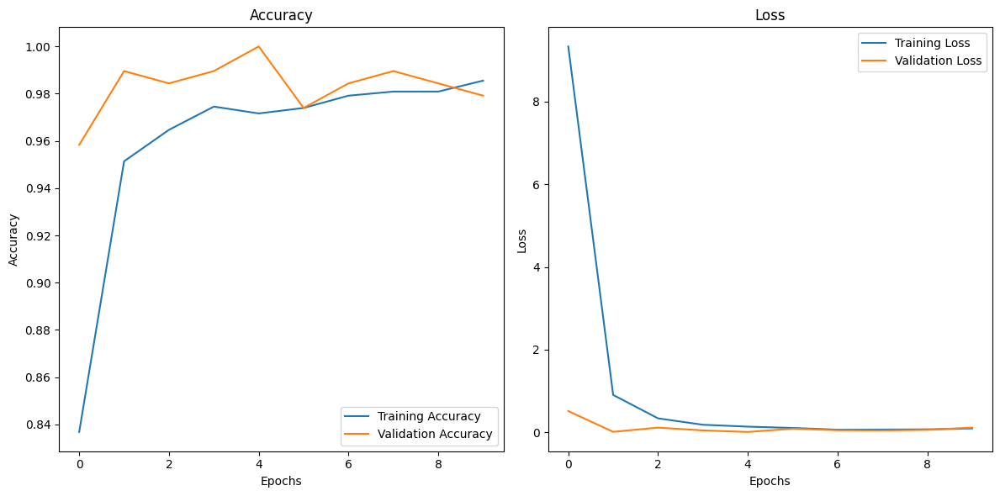

In [55]:
import matplotlib.pyplot as plt
# Plot accuracy
plt.figure(figsize=(12, 6))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history_vgg.history['accuracy'], label='Training Accuracy')
plt.plot(history_vgg.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history_vgg.history['loss'], label='Training Loss')
plt.plot(history_vgg.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Show the plots
plt.tight_layout()
plt.show()

First image to predict:
Actual label: Potato___healthy
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step
Predicted label: Potato___healthy


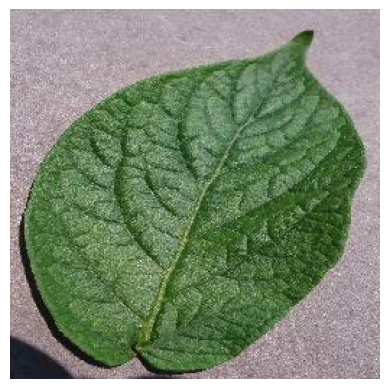

In [80]:

import numpy as np

for images_batch, labels_batch in test_ds.take(1):
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("First image to predict:")
    plt.imshow(first_image)
    plt.axis("off")

    actual_index = np.argmax(first_label)  # since it's one-hot encoded
    print("Actual label:", class_names[actual_index])

    batch_prediction = VGG16_model.predict(images_batch)
    predicted_index = np.argmax(batch_prediction[0])
    print("Predicted label:", class_names[predicted_index])



In [83]:
def predict(VGG16_model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)

    VGG16_predictions =VGG16_model.predict(img_array)

    VGG16_predicted_class = class_names[np.argmax(VGG16_predictions[0])]
    confidence = round(100 * (np.max(VGG16_predictions[0])), 2)
    return VGG16_predicted_class, confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


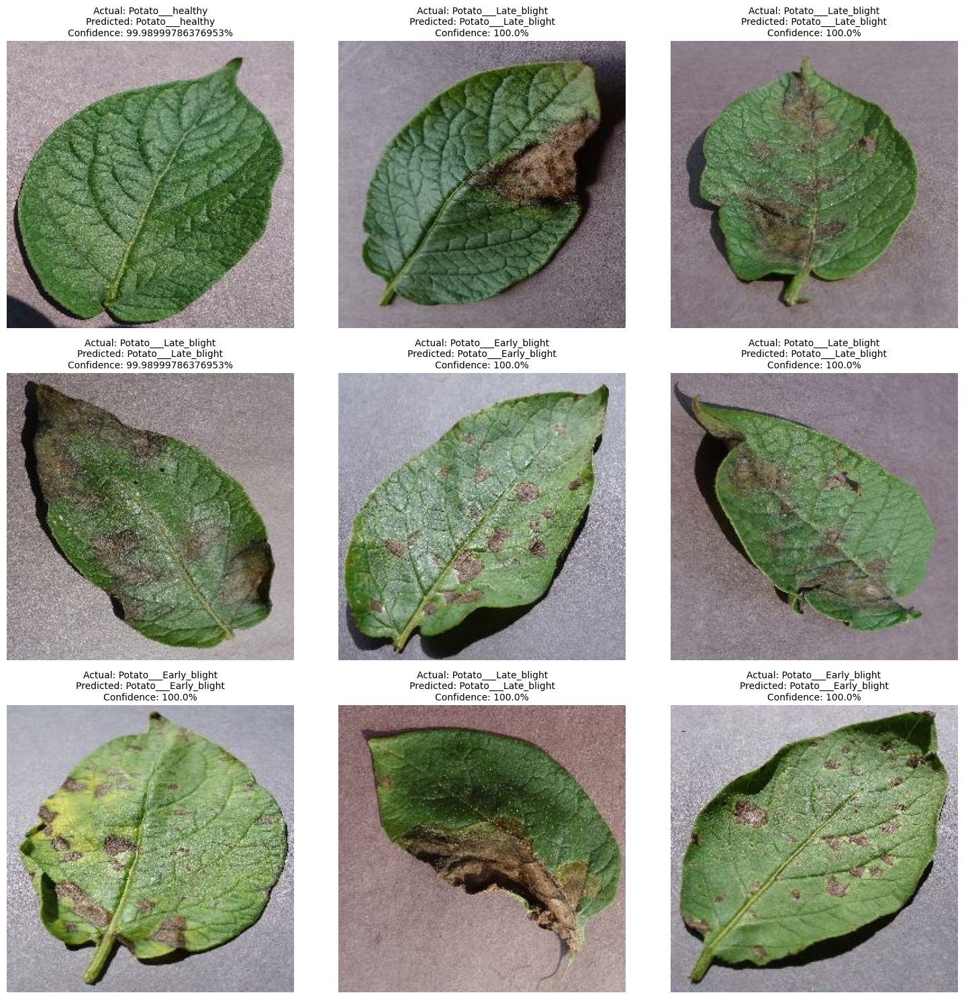

In [84]:


plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)

        image_np = images[i].numpy().astype("uint8")
        plt.imshow(image_np)

        VGG16_predicted_class, confidence = predict(VGG16_model, image_np)
        actual_class = class_names[np.argmax(labels[i].numpy())]  # decode one-hot

        plt.title(f"Actual: {actual_class}\nPredicted: {VGG16_predicted_class}\nConfidence: {confidence}%", fontsize=10)
        plt.axis("off")

plt.tight_layout()
plt.show()





1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step


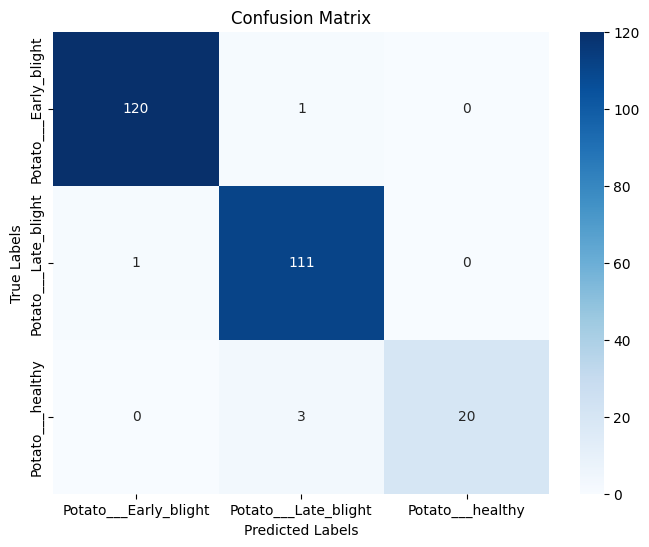

In [86]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Initialize lists to store the true labels and predicted labels
y_true2 = []
y_pred2 = []

# Loop through the test dataset and get predictions
for images_batch, labels_batch in test_ds:
    # Predict labels using the model
    VGG16_batch_predictions = VGG16_model.predict(images_batch)
    VGG16_predicted_labels = np.argmax(VGG16_batch_predictions, axis=1)  # Get the predicted class labels (indices)

    # Convert one-hot encoded labels to class indices
    true_labels = np.argmax(labels_batch.numpy(), axis=1)



    # Append the true and predicted labels to the lists
    y_true2.extend(true_labels)
    y_pred2.extend(VGG16_predicted_labels)

# Compute confusion matrix
cm1 = confusion_matrix(y_true2, y_pred2)

# Plot confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm1, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()




In [98]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Calculate precision, recall, f1-score, and accuracy
precision = precision_score(y_true2, y_pred2, average='weighted')  # Change 'weighted' to 'micro' or 'macro' if needed
recall = recall_score(y_true2, y_pred2, average='weighted')
f1 = f1_score(y_true2, y_pred2, average='weighted')
accuracy = accuracy_score(y_true2, y_pred2)

# Print the metrics
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Accuracy: {accuracy}")

Precision: 0.9808763586956522
Recall: 0.98046875
F1 Score: 0.9801890175186968
Accuracy: 0.98046875


In [87]:
# Create a directory in Google Drive to save the model (optional)
VGG16_model_save_path = '/content/drive/MyDrive/ds_plantleaves_potato'  # Adjust the path as needed
os.makedirs(VGG16_model_save_path, exist_ok=True)

# Save the model
VGG16_model_version = 1
VGG16_model.save(os.path.join(VGG16_model_save_path, f'VGG16_model_{VGG16_model_version}.keras'))

In [15]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB0
import os

# Define image size, batch size, and number of epochs
IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 10  # Adjust as needed

# Define the input shape for EfficientNet (same as CNN/VGG)
input_shape = (IMAGE_SIZE, IMAGE_SIZE, CHANNELS)

# Load pre-trained EfficientNetB0 model + top layers removed
EfficientNetB0_base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the base model layers (pre-trained weights will not be updated during training)
EfficientNetB0_base_model.trainable = False

# Build the full model
EfficientNetB0_model = models.Sequential([
    EfficientNetB0_base_model,  # EfficientNet base model
    layers.GlobalAveragePooling2D(),  # Pooling layer
    layers.Dense(128, activation='relu'),  # Fully connected layer
    layers.Dropout(0.5),  # Dropout to avoid overfitting
    layers.Dense(3, activation='softmax')  # Output layer with 3 classes (potato diseases)
])

# Compile the model
EfficientNetB0_model.compile(optimizer='adam',
              loss='categorical_crossentropy',  # Use categorical crossentropy since we're dealing with multiple classes
              metrics=['accuracy'])

# Model summary to check architecture
EfficientNetB0_model.summary()

# Now, let's train the model using your existing train_ds and val_ds
history_effB0 = EfficientNetB0_model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS)

# Save the model with a unique name (to avoid overwriting any previous models)
EfficientNetB0_model_save_path = '/content/drive/MyDrive/ds_plantleaves_potato'  # Adjust as needed
os.makedirs(EfficientNetB0_model_save_path, exist_ok=True)

# Save the model with the new name (for EfficientNet)
EfficientNetB0_model_version = 1
EfficientNetB0_model.save(os.path.join(EfficientNetB0_model_save_path, f'efficientnetB0_model_v{EfficientNetB0_model_version}.keras'))  # Versioning to avoid overwriting



Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 8, 8, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │           387 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,213,926 (16.07 MB)

 Trainable params: 164,355 (642.01 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 227s 564ms/step - accuracy: 0.8066 - loss: 0.4849 - val_accuracy: 0.9792 - val_loss: 0.0683
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 18s 338ms/step - accuracy: 0.9703 - loss: 0.1040 - val_accuracy: 0.9896 - val_loss: 0.0464
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 19s 356ms/step - accuracy: 0.9789 - loss: 0.0632 - val_accuracy: 0.9896 - val_loss: 0.0379
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 18s 336ms/step - accuracy: 0.9781 - loss: 0.0568 - val_accuracy: 0.9792 - val_loss: 0.0385
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 18s 335ms/step - accuracy: 0.9811 - loss: 0.0564 - val_accuracy: 0.9792 - val_loss: 0.0397
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 20s 328ms/step - accuracy: 0.9823 - loss: 0.0527 - val_accuracy: 0.9844 - val_loss: 0.0289
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 18s 337ms/step - accuracy: 0.9934 - loss: 0.0242 - val_accuracy: 0.9844 - val_loss: 0.0313
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 20s 330ms/step - accuracy: 0.9932 - loss: 0.0232 - val_acc

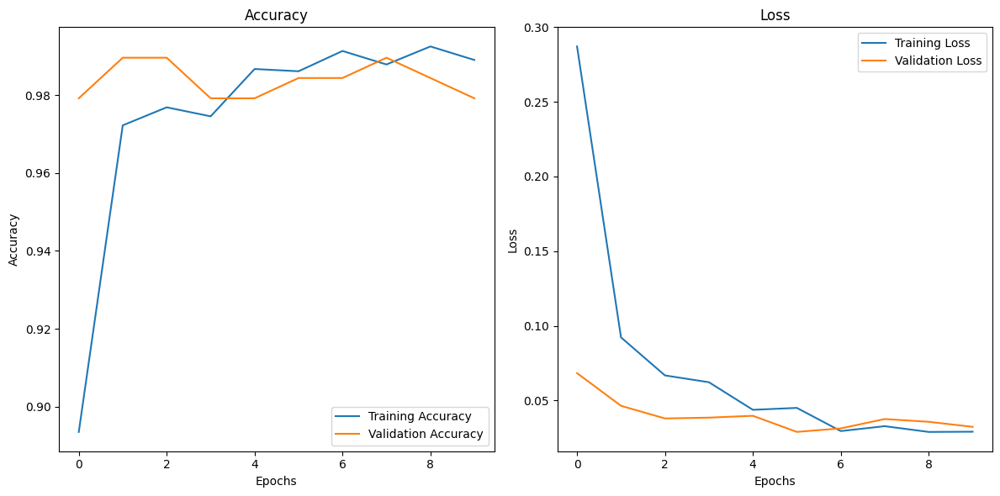

In [17]:
import matplotlib.pyplot as plt
# Plot accuracy
plt.figure(figsize=(12, 6))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history_effB0.history['accuracy'], label='Training Accuracy')
plt.plot(history_effB0.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history_effB0.history['loss'], label='Training Loss')
plt.plot(history_effB0.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Show the plots
plt.tight_layout()
plt.show()

In [24]:
def predict(EfficientNetB0_model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = tf.expand_dims(img_array, 0)

    EfficientNetB0_predictions =EfficientNetB0_model.predict(img_array)

    EfficientNetB0_predicted_class = class_names[np.argmax(EfficientNetB0_predictions[0])]
    confidence = round(100 * (np.max(EfficientNetB0_predictions[0])), 2)
    return EfficientNetB0_predicted_class, confidence


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


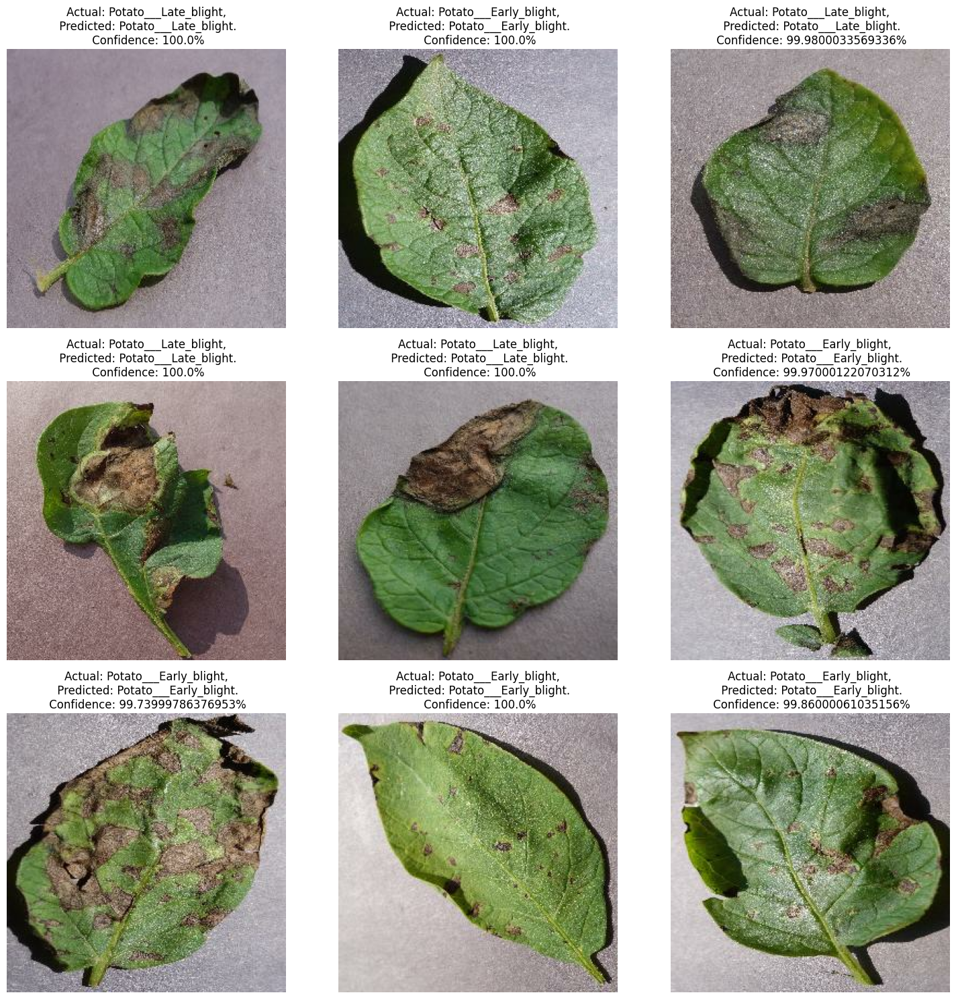

In [25]:

plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        image_np = images[i].numpy().astype("uint8")
        plt.imshow(image_np)

        EfficientNetB0_predicted_class, confidence = predict(EfficientNetB0_model, image_np)
        actual_class = class_names[np.argmax(labels[i].numpy())]  # decode one-hot

        plt.title(f"Actual: {actual_class},\n Predicted: {EfficientNetB0_predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step


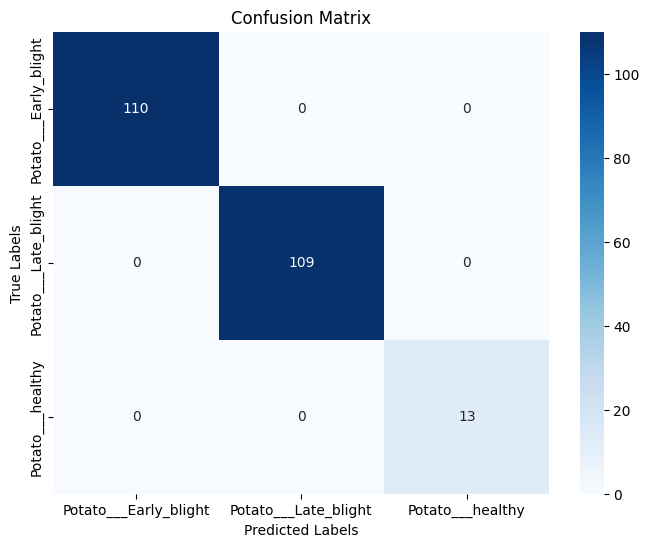

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Initialize lists to store the true labels and predicted labels
y_true3 = []
y_pred3 = []

# Loop through the test dataset and get predictions
for images_batch, labels_batch in test_ds:
    # Predict labels using the model
    EfficientNetB0_batch_predictions = EfficientNetB0_model.predict(images_batch)
    EfficientNetB0_predicted_labels = np.argmax(EfficientNetB0_batch_predictions, axis=1)  # Get the predicted class labels (indices)

     # Convert one-hot encoded labels to class indices
    true_labels = np.argmax(labels_batch.numpy(), axis=1)

    # Append the true and predicted labels to the lists
    y_true3.extend(true_labels)
    y_pred3.extend(EfficientNetB0_predicted_labels)

# Compute confusion matrix
cm2 = confusion_matrix(y_true3, y_pred3)

# Plot confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm2, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()






In [27]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Calculate precision, recall, f1-score, and accuracy
precision = precision_score(y_true3, y_pred3, average='weighted')  # Change 'weighted' to 'micro' or 'macro' if needed
recall = recall_score(y_true3, y_pred3, average='weighted')
f1 = f1_score(y_true3, y_pred3, average='weighted')
accuracy = accuracy_score(y_true3, y_pred3)

# Print the metrics
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Accuracy: {accuracy}")


Precision: 1.0
Recall: 1.0
F1 Score: 1.0
Accuracy: 1.0


Trial 1: Fine-Tuning the EfficientNetB0 Base Model (Unfreeze Layers)
Objective: Unfreeze the last few layers of the pre-trained EfficientNetB0 model to allow for fine-tuning, adapting the model weights to your specific potato leaf disease dataset.

Steps:

Unfreeze the top 30 layers of the pre-trained EfficientNetB0 base model (or experiment with different numbers of layers).

Set a lower learning rate (e.g., 1e-5) to ensure the pre-trained weights are updated gradually without forgetting previous learning.

Continue training for a few more epochs with this fine-tuning approach.


Outcome to Observe: Compare the performance (accuracy, loss, validation accuracy) before and after fine-tuning to see if the base model's weights improve task-specific features.



In [ ]:
from tensorflow.keras.models import load_model

# Define the path where the model is saved
EfficientNetB0_model_save_path = '/content/drive/MyDrive/ds_plantleaves_potato'  # Adjust as needed
model_version = 1  # The version of the model you want to load

# Load the saved model
loaded_model = load_model(os.path.join(EfficientNetB0_model_save_path, f'efficientnet_model_v{model_version}.keras'))

# Print model summary to verify it is loaded correctly
loaded_model.summary()



Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)          │ (None, 8, 8, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │         163,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 3)                   │             387 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,542,638 (17.33 MB)

 Trainable params: 164,355 (642.01 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

 Optimizer params: 328,712 (1.25 MB)

In [ ]:
# Access the base model (EfficientNetB0) from the loaded model
EfficientNetB0_base_model = loaded_model.layers[0]  # EfficientNetB0 base model is the first layer

# Unfreeze the last few layers of the base model
for layer in EfficientNetB0_base_model.layers[-30:]:  # Adjust as needed
    layer.trainable = True

# Recompile with a lower learning rate
loaded_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
                     loss='categorical_crossentropy',
                     metrics=['accuracy'])

# Continue training
history_finetuned = loaded_model.fit(train_ds, validation_data=val_ds, epochs=10)

# Save the model with a unique name (to avoid overwriting any previous models)
EfficientNetB0_model1_save_path = '/content/drive/MyDrive/ds_plantleaves_potato'  # Adjust as needed
os.makedirs(EfficientNetB0_model1_save_path, exist_ok=True)

# Save the model with the new name (for EfficientNet)
EfficientNetB0_model1_version = 2
EfficientNetB0_model1.save(os.path.join(EfficientNetB0_model1_save_path, f'efficientnet_model1_v{EfficientNetB0_model_version}.keras'))  # Versioning to avoid overwriting







Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 273s 4s/step - accuracy: 0.9967 - loss: 0.0240 - val_accuracy: 1.0000 - val_loss: 0.0106
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 222s 4s/step - accuracy: 0.9958 - loss: 0.0242 - val_accuracy: 0.9948 - val_loss: 0.0099
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 271s 4s/step - accuracy: 0.9993 - loss: 0.0171 - val_accuracy: 1.0000 - val_loss: 0.0094
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 223s 4s/step - accuracy: 0.9989 - loss: 0.0152 - val_accuracy: 1.0000 - val_loss: 0.0089
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 221s 4s/step - accuracy: 0.9985 - loss: 0.0154 - val_accuracy: 1.0000 - val_loss: 0.0086
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 264s 4s/step - accuracy: 0.9977 - loss: 0.0118 - val_accuracy: 0.9948 - val_loss: 0.0089
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 261s 4s/step - accuracy: 0.9977 - loss: 0.0125 - val_accuracy: 0.9948 - val_loss: 0.0088
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 263s 4s/step - accuracy: 0.9987 - loss: 0.0144 - val_accuracy: 0.9948 - v

NameError: name 'EfficientNetB0_model1' is not defined

NameError: name 'history_finetuned' is not defined

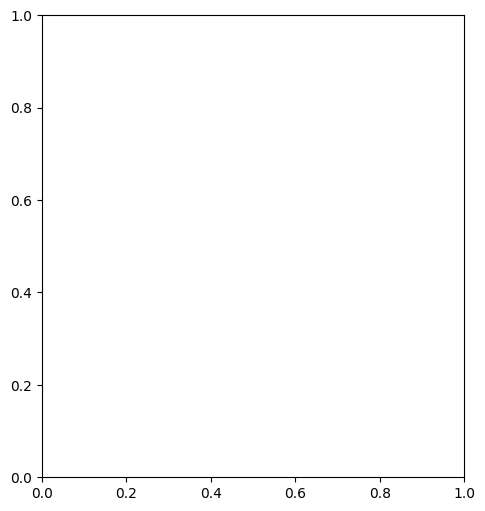

In [ ]:
import matplotlib.pyplot as plt
# Plot accuracy
plt.figure(figsize=(12, 6))



# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(history_finetuned.history['accuracy'], label='Training Accuracy')
plt.plot(history_finetuned.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history_finetuned.history['loss'], label='Training Loss')
plt.plot(history_finetuned.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Show the plots
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Initialize lists to store the true labels and predicted labels
y_true3 = []
y_pred3 = []

# Loop through the test dataset and get predictions
for images_batch, labels_batch in test_ds:
    # Predict labels using the model
    EfficientNetB0_batch_predictions = EfficientNetB0_model.predict(images_batch)
    EfficientNetB0_predicted_labels = np.argmax(EfficientNetB0_batch_predictions, axis=1)  # Get the predicted class labels (indices)

    # Since labels are integer encoded, use them as is
    true_labels = labels_batch.numpy()  # Use as is for integer encoded labels

    # Append the true and predicted labels to the lists
    y_true3.extend(true_labels)
    y_pred3.extend(EfficientNetB0_predicted_labels)

# Compute confusion matrix
cm = confusion_matrix(y_true3, y_pred3)

# Plot confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()


NameError: name 'test_ds' is not defined

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Calculate precision, recall, f1-score, and accuracy
precision = precision_score(y_true3, y_pred3, average='weighted')  # Change 'weighted' to 'micro' or 'macro' if needed
recall = recall_score(y_true3, y_pred3, average='weighted')
f1 = f1_score(y_true3, y_pred3, average='weighted')
accuracy = accuracy_score(y_true3, y_pred3)

# Print the metrics
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Accuracy: {accuracy}")